# Instance Segmentation

##### Detectron2 다운로드



```
coco/
  annotations/
    instances_{train,val}2017.json
    person_keypoints_{train,val}2017.json
  {train,val}2017/
```



In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-_paww5b_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-_paww5b_
  Resolved https://github.com/facebookresearch/fvcore.git to commit 51092b5515cbb493f73de079743dd6b11cc4bbf1
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.6-py3-none-any.whl size=65405 sha256=e5e5695e4b27a529a576d421bc8d4796d8049fb6cce6e8d3bf489d45fed9b9df
  Stored in directory: /tmp/pip-ephem-wheel-cache-y5bds9sh/wheels/1a/ae/26/d93adc5470e3323d9144ccbcb7b8be77f040ec5087c3839d70
Successfully built fvcore
  Attempting uninstall: fvcore
    Found existing installation: fvcore 0.1.5.post20221221
    Uninstalling fvcore-0.1.5.post20221221

##### COCO 2017 데이터셋 다운로드

In [ ]:
!rm -r coco

rm: cannot remove 'coco': No such file or directory


In [ ]:
# 데이터셋 다운로드
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

--2023-03-23 03:02:25--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.139.161, 3.5.29.111, 52.217.141.89, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.139.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  21.9MB/s    in 9m 35s  

2023-03-23 03:12:00 (32.1 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]

--2023-03-23 03:12:00--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.0.211, 52.217.105.156, 52.216.42.89, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.0.211|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  

In [ ]:
# Unzip
!unzip train2017.zip -d ./coco
!rm train2017.zip
!unzip val2017.zip -d ./coco
!rm val2017.zip
!unzip annotations_trainval2017.zip -d ./coco
!rm annotations_trainval2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: ./coco/val2017/000000365745.jpg  
 extracting: ./coco/val2017/000000320425.jpg  
 extracting: ./coco/val2017/000000481404.jpg  
 extracting: ./coco/val2017/000000314294.jpg  
 extracting: ./coco/val2017/000000335328.jpg  
 extracting: ./coco/val2017/000000513688.jpg  
 extracting: ./coco/val2017/000000158548.jpg  
 extracting: ./coco/val2017/000000132116.jpg  
 extracting: ./coco/val2017/000000415238.jpg  
 extracting: ./coco/val2017/000000321333.jpg  
 extracting: ./coco/val2017/000000081738.jpg  
 extracting: ./coco/val2017/000000577584.jpg  
 extracting: ./coco/val2017/000000346905.jpg  
 extracting: ./coco/val2017/000000433980.jpg  
 extracting: ./coco/val2017/000000228144.jpg  
 extracting: ./coco/val2017/000000041872.jpg  
 extracting: ./coco/val2017/000000117492.jpg  
 extracting: ./coco/val2017/000000368900.jpg  
 extracting: ./coco/val2017/000000376900.jpg  
 extracting: ./coco/val2017/000000352491.jpg  
 extracti

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader

In [ ]:
import torch
# 재현성을 위한 랜덤시드 고정
random_seed = 2023
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("coco_train_data", {}, "/content/coco/annotations/instances_val2017.json", "/content/coco/val2017")
register_coco_instances("coco_val_data", {}, "/content/coco/annotations/instances_val2017.json", "/content/coco/val2017")

In [ ]:
# MetadataCatalog
train_metadata = MetadataCatalog.get("coco_train_data")
val_metadata = MetadataCatalog.get("coco_val_data")
train_metadata

Metadata(name='coco_train_data', json_file='/content/coco/annotations/instances_val2017.json', image_root='/content/coco/val2017', evaluator_type='coco')

In [ ]:
# DatasetCatalog
train_dataset_dicts = DatasetCatalog.get("coco_train_data")
val_dataset_dicts = DatasetCatalog.get("coco_val_data")
val_dataset_dicts

[03/23 04:18:23 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /content/coco/annotations/instances_val2017.json
[03/23 04:18:24 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /content/coco/annotations/instances_val2017.json


[{'file_name': '/content/coco/val2017/000000000139.jpg',
  'height': 426,
  'width': 640,
  'image_id': 139,
  'annotations': [{'iscrowd': 0,
    'bbox': [236.98, 142.51, 24.7, 69.5],
    'category_id': 58,
    'segmentation': [[240.86,
      211.31,
      240.16,
      197.19,
      236.98,
      192.26,
      237.34,
      187.67,
      245.8,
      188.02,
      243.33,
      176.02,
      250.39,
      186.96,
      251.8,
      166.85,
      255.33,
      142.51,
      253.21,
      190.49,
      261.68,
      183.08,
      258.86,
      191.2,
      260.98,
      206.37,
      254.63,
      199.66,
      252.51,
      201.78,
      251.8,
      212.01]],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>},
   {'iscrowd': 0,
    'bbox': [7.03, 167.76, 149.32, 94.87],
    'category_id': 62,
    'segmentation': [[9.66,
      167.76,
      156.35,
      173.04,
      153.71,
      256.48,
      82.56,
      262.63,
      7.03,
      260.87]],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>},
   {'iscrowd

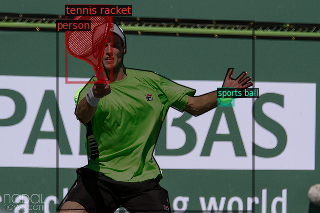

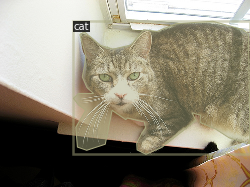

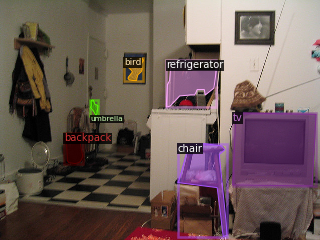

In [ ]:
from detectron2.utils.visualizer import Visualizer

for d in random.sample(train_dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(
    "./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)
cfg.DATASETS.TRAIN = ("coco_train_data",)
cfg.DATASETS.TEST = ("coco_val_data",)  # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = (
    1000
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    128
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 80
cfg.OUTPUT_DIR = "/content/outputs"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/23 04:18:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 112MB/s]                           


[03/23 04:18:49 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/23 04:19:09 d2.utils.events]:  eta: 0:08:48  iter: 19  total_loss: 0.9295  loss_cls: 0.2411  loss_box_reg: 0.3202  loss_mask: 0.2221  loss_rpn_cls: 0.0228  loss_rpn_loc: 0.06103    time: 0.5588  last_time: 0.6659  data_time: 0.0357  last_data_time: 0.0067   lr: 3.9962e-05  max_mem: 2535M
[03/23 04:19:21 d2.utils.events]:  eta: 0:09:09  iter: 39  total_loss: 0.7404  loss_cls: 0.1823  loss_box_reg: 0.2709  loss_mask: 0.1979  loss_rpn_cls: 0.01214  loss_rpn_loc: 0.02533    time: 0.5597  last_time: 0.6015  data_time: 0.0128  last_data_time: 0.0090   lr: 7.9922e-05  max_mem: 2582M
[03/23 04:19:32 d2.utils.events]:  eta: 0:08:42  iter: 59  total_loss: 0.9424  loss_cls: 0.2573  loss_box_reg: 0.3228  loss_mask: 0.2244  loss_rpn_cls: 0.01894  loss_rpn_loc: 0.04227    time: 0.5557  last_time: 0.6047  data_time: 0.0136  last_data_time: 0.0119   lr: 0.00011988  max_mem: 2582M
[03/23 04:19:44 d2.utils.events]:  eta: 0:08:57  iter: 79  total_loss: 1.086  loss_cls: 0.3337  loss_box_reg: 0.3914  l

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("coco_val_data",output_dir="./output")
val_loader = build_detection_test_loader(cfg, "coco_val_data")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/23 04:28:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...
[03/23 04:28:27 d2.data.datasets.coco]: Loading /content/coco/annotations/instances_val2017.json takes 1.04 seconds.
[03/23 04:28:27 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /content/coco/annotations/instances_val2017.json
[03/23 04:28:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/23 04:28:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/23 04:28:27 d2.data.common]: Serializing 5000 elements to byte tensors and concatenating them all ...
[03/23 04:28:27 d2.data.common]: Serialized dataset takes 19.10 MiB
[03/23 04:28:27 d2.evaluation.evaluator]: Start inference on 5000 batches
[03/23 04:28:30 d2.evaluation.evaluator]: Inference done 11/5000. Dataloading: 0.00

OrderedDict([('bbox',
              {'AP': 28.483421727432834,
               'AP50': 46.79945710403991,
               'AP75': 30.99491336647654,
               'APs': 17.59793212448631,
               'APm': 31.74795297931033,
               'APl': 36.40205575978887,
               'AP-person': 46.44081474962204,
               'AP-bicycle': 19.80094947766628,
               'AP-car': 37.914674175466764,
               'AP-motorcycle': 24.546239317378248,
               'AP-airplane': 40.769496279782054,
               'AP-bus': 44.602079298354596,
               'AP-train': 27.57735241490798,
               'AP-truck': 19.805540083836153,
               'AP-boat': 16.28007417697093,
               'AP-traffic light': 24.324768661662333,
               'AP-fire hydrant': 51.75621756968988,
               'AP-stop sign': 47.90064913809219,
               'AP-parking meter': 41.14545976922974,
               'AP-bench': 19.556338523157233,
               'AP-bird': 23.09240727498981,
 

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("coco_val_data", )
predictor = DefaultPredictor(cfg)

[03/23 04:42:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...


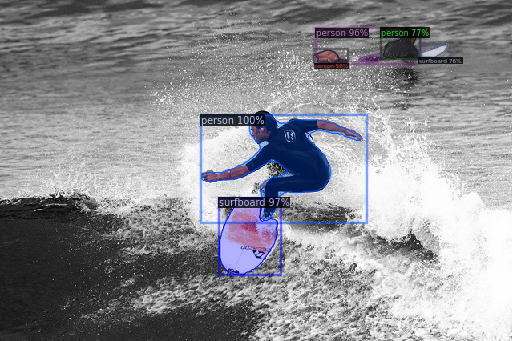

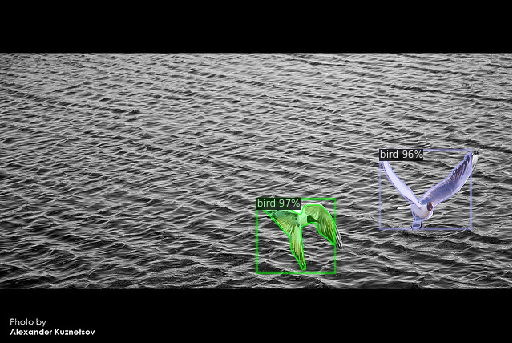

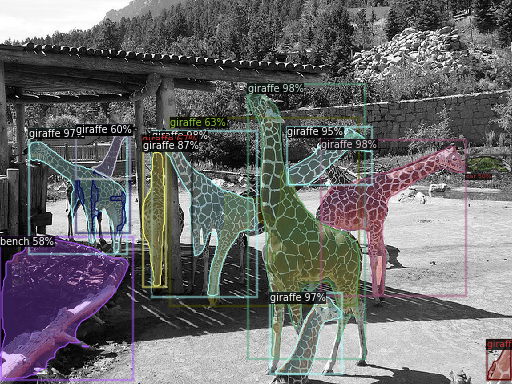

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!pip install --upgrade --no-cache-dir gdown
!gdown https://drive.google.com/uc?id=1wS6W88fxXXEEGbe2XnCmrJxlDMSo-dpZ

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Downloading...
From: https://drive.google.com/uc?id=1wS6W88fxXXEEGbe2XnCmrJxlDMSo-dpZ
To: /content/instance_custom_annotation.zip
100% 7.66k/7.66k [00:00<00:00, 12.5MB/s]


In [ ]:
!unzip /content/instance_custom_annotation.zip -d /content/coco

Archive:  /content/instance_custom_annotation.zip
  inflating: /content/coco/__MACOSX/._annotations  
  inflating: /content/coco/annotations/instances_custom.json  
  inflating: /content/coco/__MACOSX/annotations/._instances_custom.json  


In [ ]:
from pycocotools.coco import COCO
coco=COCO('/content/coco/annotations/instances_val2017.json')

loading annotations into memory...
Done (t=2.04s)
creating index...
index created!


In [ ]:
import json
with open('/content/coco/annotations/instances_custom.json', 'r') as f:
    custom_json_data = json.load(f)
temp_categories = custom_json_data['categories']

with open('/content/coco/annotations/instances_val2017.json', 'r') as f:
    original_json_data = json.load(f)

custom_json_data['licenses'] = original_json_data['licenses']
custom_json_data['info'] = original_json_data['info']
custom_json_data['categories'] = original_json_data['categories']
change_categories_dict = {}

for temp in temp_categories:
  change_categories_dict[temp['id']] = coco.getCatIds(catNms=[temp['name']])[0]
print(change_categories_dict)
for ann in custom_json_data['annotations']:
  ann["category_id"] = change_categories_dict[ann["category_id"]]

print(custom_json_data)

{1: 21, 2: 88, 3: 17, 4: 32, 5: 5, 6: 16}
{'licenses': [{'url': 'http://creativecommons.org/licenses/by-nc-sa/2.0/', 'id': 1, 'name': 'Attribution-NonCommercial-ShareAlike License'}, {'url': 'http://creativecommons.org/licenses/by-nc/2.0/', 'id': 2, 'name': 'Attribution-NonCommercial License'}, {'url': 'http://creativecommons.org/licenses/by-nc-nd/2.0/', 'id': 3, 'name': 'Attribution-NonCommercial-NoDerivs License'}, {'url': 'http://creativecommons.org/licenses/by/2.0/', 'id': 4, 'name': 'Attribution License'}, {'url': 'http://creativecommons.org/licenses/by-sa/2.0/', 'id': 5, 'name': 'Attribution-ShareAlike License'}, {'url': 'http://creativecommons.org/licenses/by-nd/2.0/', 'id': 6, 'name': 'Attribution-NoDerivs License'}, {'url': 'http://flickr.com/commons/usage/', 'id': 7, 'name': 'No known copyright restrictions'}, {'url': 'http://www.usa.gov/copyright.shtml', 'id': 8, 'name': 'United States Government Work'}], 'info': {'description': 'COCO 2017 Dataset', 'url': 'http://cocodatase

In [ ]:
with open('/content/coco/annotations/instances_custom.json', 'w', encoding='utf-8') as make_file:
    json.dump(custom_json_data, make_file, indent="\t")

In [ ]:
!gdown https://drive.google.com/uc?id=1e2ox8p4ttpbLcMP_VkgJCBw0I892etOp

Downloading...
From: https://drive.google.com/uc?id=1e2ox8p4ttpbLcMP_VkgJCBw0I892etOp
To: /content/segmentation_images.zip
100% 516k/516k [00:00<00:00, 118MB/s]


In [ ]:
!unzip /content/segmentation_images.zip -d /content/coco

Archive:  /content/segmentation_images.zip
   creating: /content/coco/segmentation_images/
  inflating: /content/coco/segmentation_images/000000000665.jpg  
  inflating: /content/coco/segmentation_images/000000005685.jpg  
  inflating: /content/coco/segmentation_images/000000000155.jpg  
  inflating: /content/coco/segmentation_images/000000004053.jpg  
  inflating: /content/coco/segmentation_images/000000000019.jpg  


In [ ]:
register_coco_instances("coco_test_data", {}, "/content/coco/annotations/instances_custom.json", "/content/coco/segmentation_images")

In [ ]:
test_metadata = MetadataCatalog.get("coco_test_data")
test_dataset_dicts = DatasetCatalog.get("coco_test_data")

[03/23 04:42:40 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/coco/annotations/instances_custom.json


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("coco_test_data",output_dir="./output")
val_loader = build_detection_test_loader(cfg, "coco_test_data")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/23 04:42:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...
[03/23 04:42:42 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/coco/annotations/instances_custom.json
[03/23 04:42:42 d2.data.build]: Distribution of instances among all 80 categories:
|   category    | #instances   |   category   | #instances   |   category    | #instances   |
|:-------------:|:-------------|:------------:|:-------------|:-------------:|:-------------|
|    person     | 0            |   bicycle    | 0            |      car      | 0            |
|  motorcycle   | 0            |   airplane   | 1            |      bus      | 0            |
|     train     | 0            |    truck     | 0            |     boat      | 0            |
| traffic light | 0            | fire hydrant | 0            |   stop sign   | 0            |
| parking meter | 0            |    bench     | 0            |     bird      | 1            |
|      c

OrderedDict([('bbox',
              {'AP': 66.66666666666666,
               'AP50': 100.0,
               'AP75': 83.33333333333334,
               'APs': nan,
               'APm': 80.0,
               'APl': 66.0,
               'AP-person': nan,
               'AP-bicycle': nan,
               'AP-car': nan,
               'AP-motorcycle': nan,
               'AP-airplane': 70.0,
               'AP-bus': nan,
               'AP-train': nan,
               'AP-truck': nan,
               'AP-boat': nan,
               'AP-traffic light': nan,
               'AP-fire hydrant': nan,
               'AP-stop sign': nan,
               'AP-parking meter': nan,
               'AP-bench': nan,
               'AP-bird': 70.0,
               'AP-cat': 30.0,
               'AP-dog': nan,
               'AP-horse': nan,
               'AP-sheep': nan,
               'AP-cow': 90.0,
               'AP-elephant': nan,
               'AP-bear': nan,
               'AP-zebra': nan,
               

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("coco_test_data", )
predictor = DefaultPredictor(cfg)

[03/23 04:42:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...


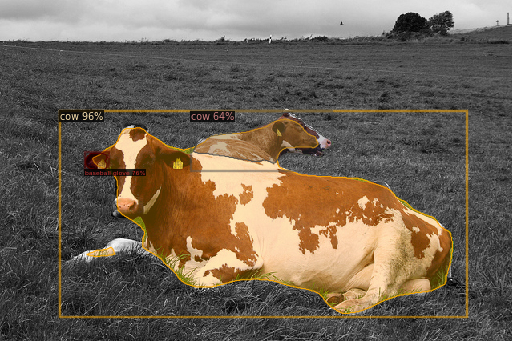

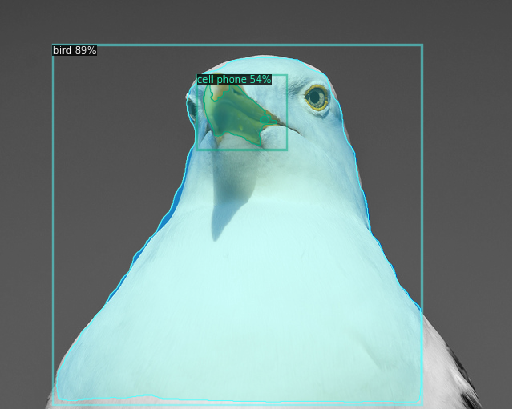

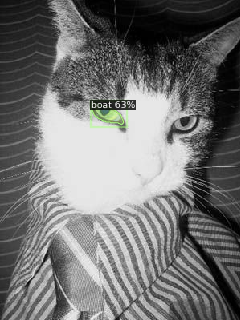

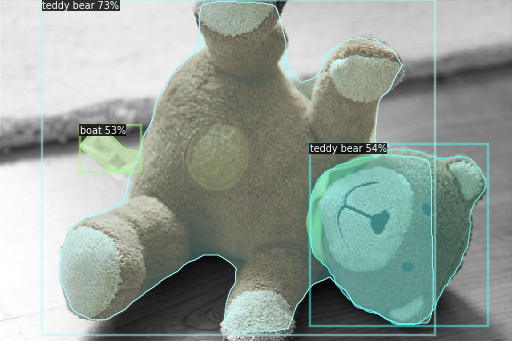

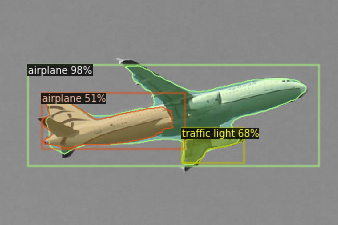

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(test_dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])